In [1]:
import pandas as pd
import numpy as np
import matplotlib
import matplotlib.pyplot as plt
import warnings
warnings.filterwarnings('ignore')

%matplotlib inline
%config InlineBackend.figure_format='retina'

# load global efficiency

In [2]:
hcp_globalEff_data = r'E:\gregn\data\HCP\HCP_globalEfficiency_2scan.h5'
hcp_globalEff = pd.read_hdf(hcp_globalEff_data, 'hcp_globalEff')
hcp_globalEff = hcp_globalEff.set_index(['Subject'])
print('global efficiency\nrows:  {}\ncols:    {}'.format(hcp_globalEff.shape[0], hcp_globalEff.shape[1]))
print('\ndata type value counts:')
print(hcp_globalEff.dtypes.value_counts())

global efficiency
rows:  1082
cols:    90

data type value counts:
float64    90
dtype: int64


# load restricted data

In [3]:
hcp_restricted_data = r'E:\gregn\data\HCP\HCP_RESTRICTED.h5'
hcp_restricted = pd.read_hdf(hcp_restricted_data, 'hcp_restricted')
hcp_restricted = hcp_restricted.set_index(['Subject'])
print('HCP RESTRICTED\nrows: {}\ncols:  {}'.format(hcp_restricted.shape[0], hcp_restricted.shape[1]))
print('\ndata type value counts:')
print(hcp_restricted.dtypes.value_counts())

HCP RESTRICTED
rows: 1206
cols:  200

data type value counts:
float64    177
bool         9
object       8
int64        6
dtype: int64


# join data

In [4]:
hcp = hcp_globalEff.join(hcp_restricted[['Family_ID', 'SSAGA_Mj_Ab_Dep']])
print('HCP \nrows: {}\ncols:   {}'.format(hcp.shape[0], hcp.shape[1]))
print('\ndata type value counts:')
print(hcp.dtypes.value_counts())

HCP 
rows: 1082
cols:   92

data type value counts:
float64    91
object      1
dtype: int64


# y target variable

In [5]:
hcp = hcp.dropna(subset=['SSAGA_Mj_Ab_Dep'])

y = hcp['SSAGA_Mj_Ab_Dep'].values
print('dependence class counts:\n')
print(hcp['SSAGA_Mj_Ab_Dep'].value_counts())

dependence class counts:

0.0    983
1.0     97
Name: SSAGA_Mj_Ab_Dep, dtype: int64


# X features

In [6]:
X = hcp
X = X.drop(['SSAGA_Mj_Ab_Dep', 'Family_ID'], axis=1)
print('number of features:', len(X.columns))
list(X.columns)

number of features: 90


['Cingulum_Ant_R',
 'Cingulum_Mid_L',
 'Cingulum_Mid_R',
 'Cingulum_Post_L',
 'Cingulum_Post_R',
 'Cuneus_L',
 'Cuneus_R',
 'Frontal_Inf_Oper_L',
 'Frontal_Inf_Oper_R',
 'Frontal_Inf_Orb_L',
 'Amygdala_L',
 'Frontal_Inf_Orb_R',
 'Frontal_Inf_Tri_L',
 'Frontal_Inf_Tri_R',
 'Frontal_Mid_Orb_L',
 'Frontal_Mid_Orb_R',
 'Frontal_Mid_L',
 'Frontal_Mid_Orb_L.1',
 'Frontal_Mid_Orb_R.1',
 'Frontal_Mid_R',
 'Frontal_Sup_L',
 'Amygdala_R',
 'Frontal_Sup_Medial_L',
 'Frontal_Sup_Medial_R',
 'Frontal_Sup_Orb_L',
 'Frontal_Sup_Orb_R',
 'Frontal_Sup_R',
 'Fusiform_L',
 'Fusiform_R',
 'Heschl_L',
 'Heschl_R',
 'Hippocampus_L',
 'Angular_L',
 'Hippocampus_R',
 'Insula_L',
 'Insula_R',
 'Lingual_L',
 'Lingual_R',
 'Occipital_Inf_L',
 'Occipital_Inf_R',
 'Occipital_Mid_L',
 'Occipital_Mid_R',
 'Occipital_Sup_L',
 'Angular_R',
 'Occipital_Sup_R',
 'Olfactory_L',
 'Olfactory_R',
 'Pallidum_L',
 'Pallidum_R',
 'ParaHippocampal_L',
 'ParaHippocampal_R',
 'Paracentral_Lobule_L',
 'Paracentral_Lobule_R',
 'Par

# load model

In [7]:
import pickle
from sklearn.externals import joblib

gs = joblib.load('hcp_dependence_gridsearch_globalEfficiency_2scan.pkl')
scores = joblib.load('hcp_dependence_nested_score_globalEfficiency_2scan.pkl')

print('scores:', scores)
print('average score:', scores.mean())
print('std:', scores.std())
print('\nbest estimator:\n\n', gs.best_estimator_)

scores: [0.60659898 0.61725888 0.49185146 0.45300752 0.55102041]
average score: 0.5439474502063717
std: 0.06377126541649823

best estimator:

 XGBClassifier(base_score=0.5, booster='gbtree', colsample_bylevel=1,
       colsample_bytree=1, early_stopping_rounds=30, gamma=0,
       learning_rate=0.2, max_delta_step=0, max_depth=6,
       min_child_weight=1, missing=nan, n_estimators=10000, n_jobs=1,
       nthread=6, objective='binary:logistic', random_state=42,
       reg_alpha=0, reg_lambda=1, scale_pos_weight=1, seed=None,
       silent=True, subsample=0.8, tree_method='auto')


# first tree

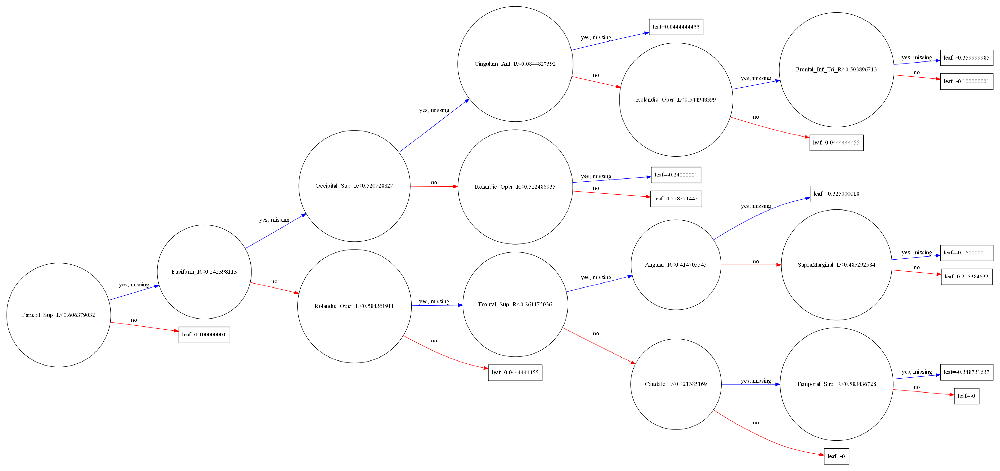

In [8]:
from xgboost import plot_tree
from matplotlib.pylab import rcParams
plt.style.use('default')
rcParams['figure.dpi'] = 200

plot_tree(gs.best_estimator_, num_trees=0, rankdir='LR')
fig = plt.gcf()
fig.set_size_inches(26.5,19)
plt.show()

# SHAP

In [9]:
import shap
shap.initjs()

numpy.core.umath_tests is an internal NumPy module and should not be imported. It will be removed in a future NumPy release.


In [10]:
explainer = shap.TreeExplainer(gs.best_estimator_)
shap_values = explainer.shap_values(X)

X_display, y_display = X, y

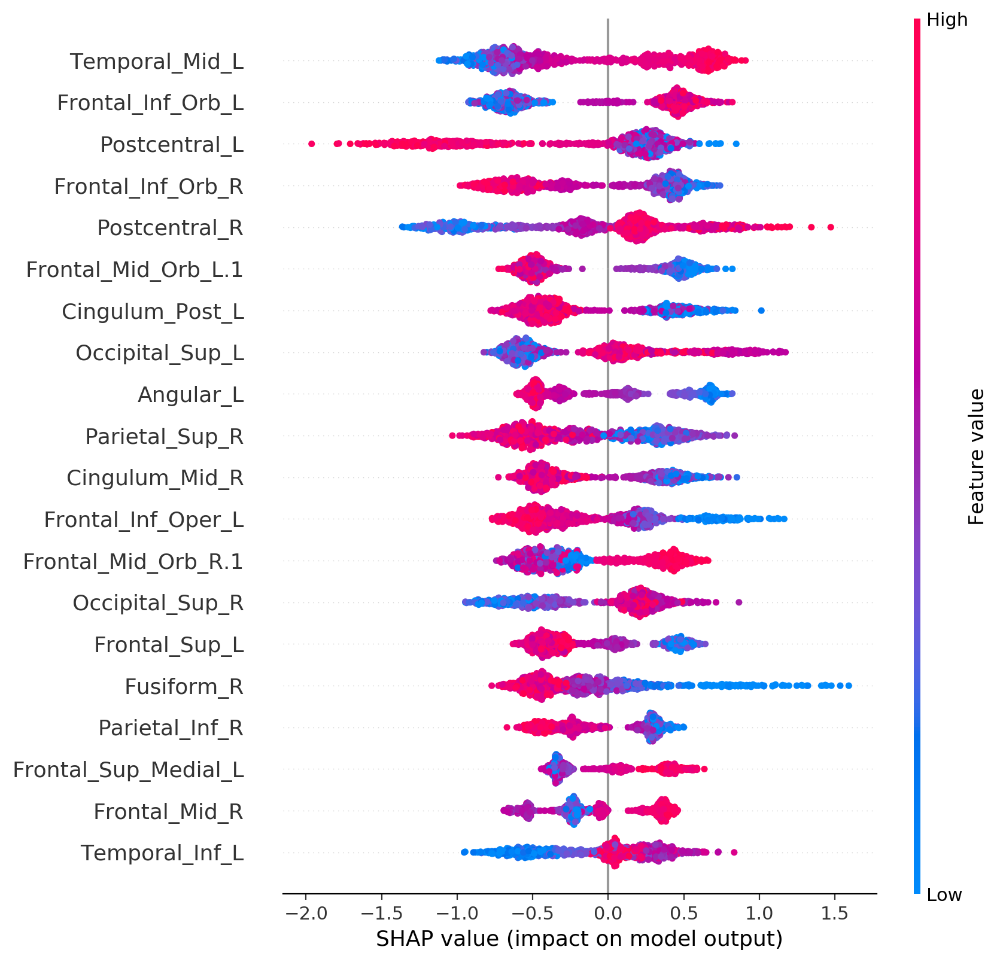

In [11]:
rcParams['figure.dpi'] = 120
plt.style.use('default')

shap.summary_plot(shap_values, X_display)

                 feature  importance       std
78        Temporal_Mid_L    0.576271  0.216950
9      Frontal_Inf_Orb_L    0.551004  0.166026
58         Postcentral_L    0.529576  0.436580
11     Frontal_Inf_Orb_R    0.488876  0.181217
59         Postcentral_R    0.482560  0.365483
17   Frontal_Mid_Orb_L.1    0.480838  0.095129
3        Cingulum_Post_L    0.449416  0.129896
42       Occipital_Sup_L    0.438965  0.276149
32             Angular_L    0.427023  0.182992
57        Parietal_Sup_R    0.416435  0.206787
2         Cingulum_Mid_R    0.408396  0.117667
7     Frontal_Inf_Oper_L    0.395275  0.206821
18   Frontal_Mid_Orb_R.1    0.393530  0.147339
44       Occipital_Sup_R    0.359591  0.204283
20         Frontal_Sup_L    0.355848  0.153651
28            Fusiform_R    0.345301  0.253473
55        Parietal_Inf_R    0.314092  0.109117
22  Frontal_Sup_Medial_L    0.310724  0.129398
19         Frontal_Mid_R    0.308310  0.156337
75        Temporal_Inf_L    0.299704  0.211659
38       Occi

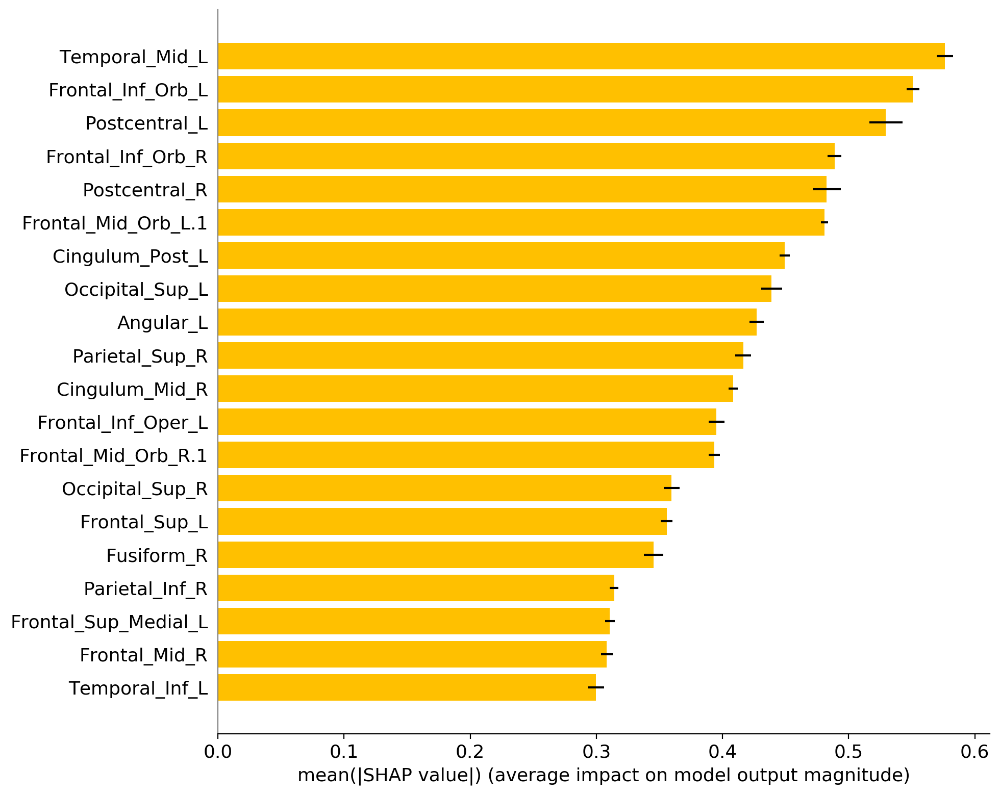

In [12]:
# feature importance
vals_mean= np.abs(shap_values).mean(0)
vals_std= np.abs(shap_values).std(0)

feature_importance = pd.DataFrame(list(zip(X.columns, vals_mean, vals_std)), 
                                  columns=['feature','importance', 'std'])
feature_importance.sort_values(by=['importance'], ascending=False, inplace=True)
with pd.option_context('display.max_rows', None):
    print(feature_importance)

    
# summary plot with standard error bars    
import math
matplotlib.rcParams.update({'font.size': 13})

feats = feature_importance['feature'][:20].reset_index()
means = np.array(feature_importance['importance'][:20])
stds = np.array(feature_importance['std'][:20])
y_pos =  np.arange(len(feats))

fig, ax = plt.subplots(figsize=(10,8))

ax.barh(y_pos, means, xerr=stds/math.sqrt(len(y)), align='center', color="#FFC000")
ax.set_yticks(y_pos)
ax.set_yticklabels(feats['feature'])
ax.invert_yaxis()
ax.set_xlabel('mean(|SHAP value|) (average impact on model output magnitude)')
ax.spines['right'].set_visible(False)
ax.spines['top'].set_visible(False)
ax.yaxis.set_ticks_position('none')
ax.spines['left'].set_color('gray')
plt.tight_layout()
plt.show()

# SHAP dependence plots
# top 20

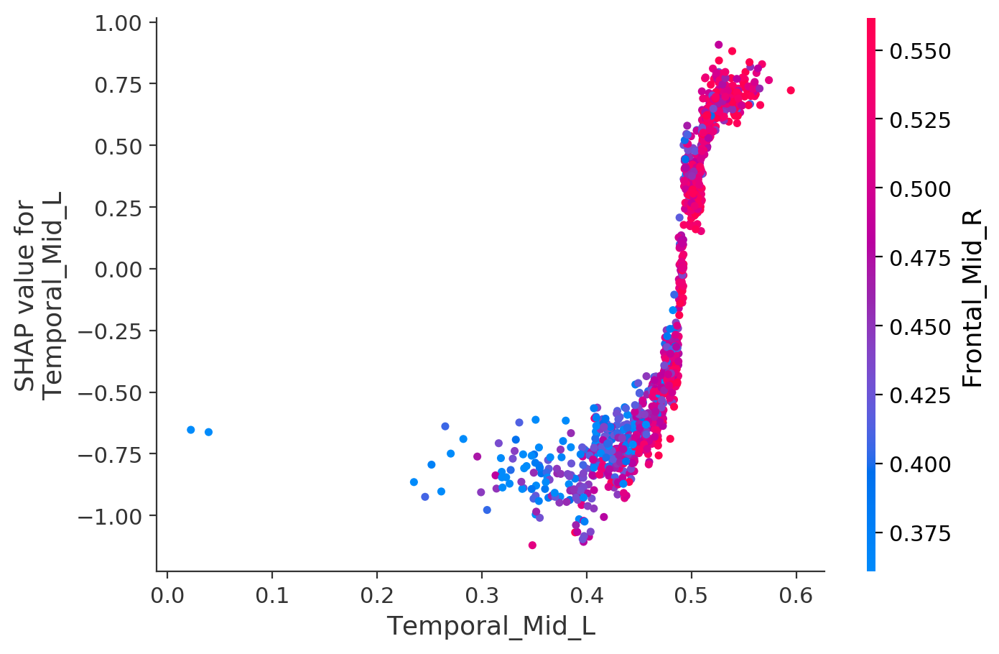

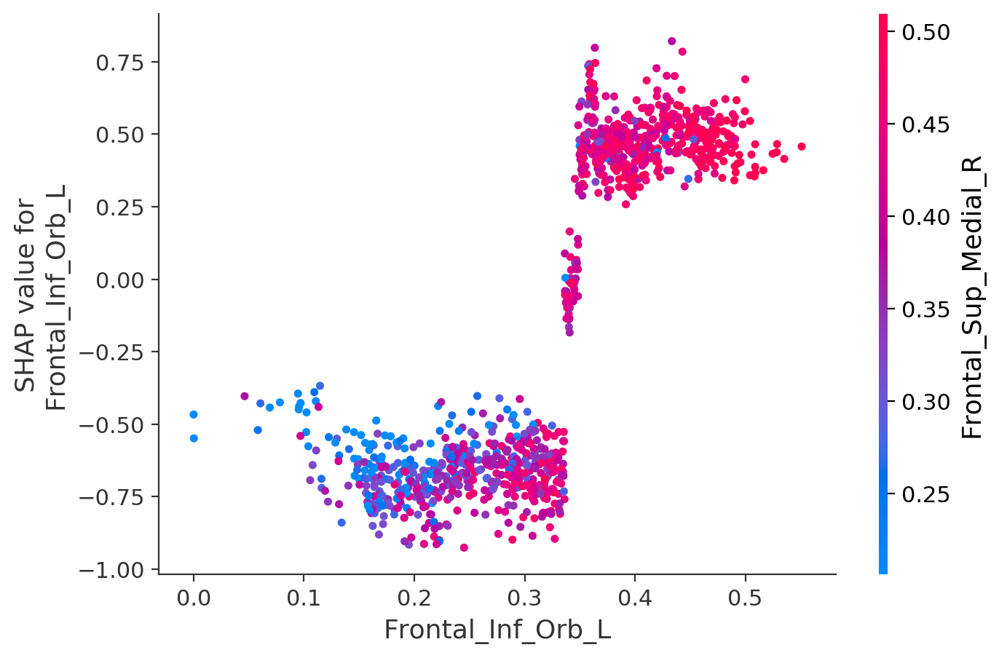

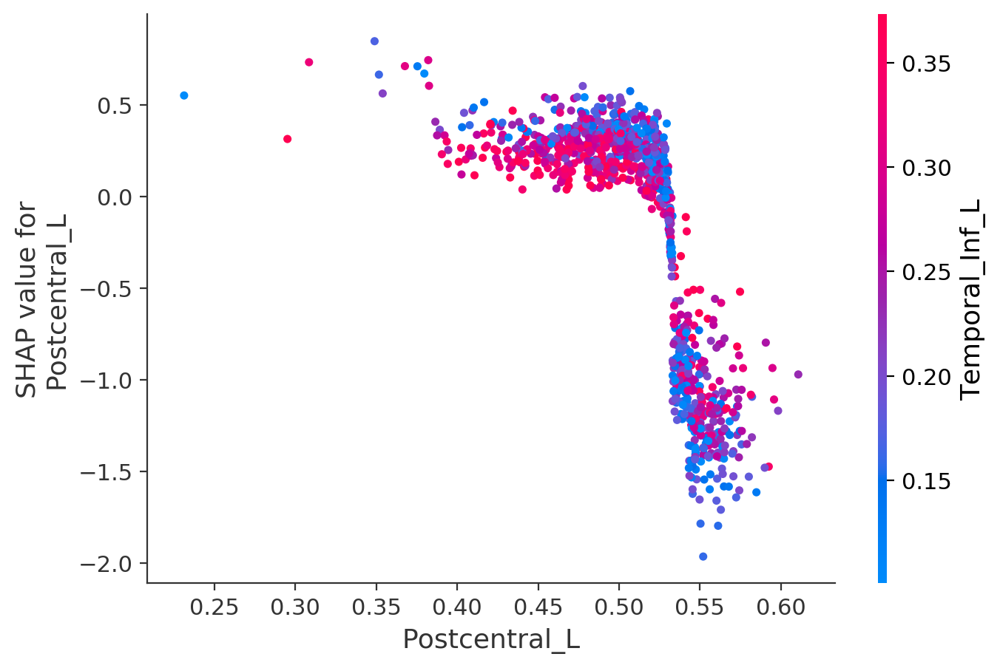

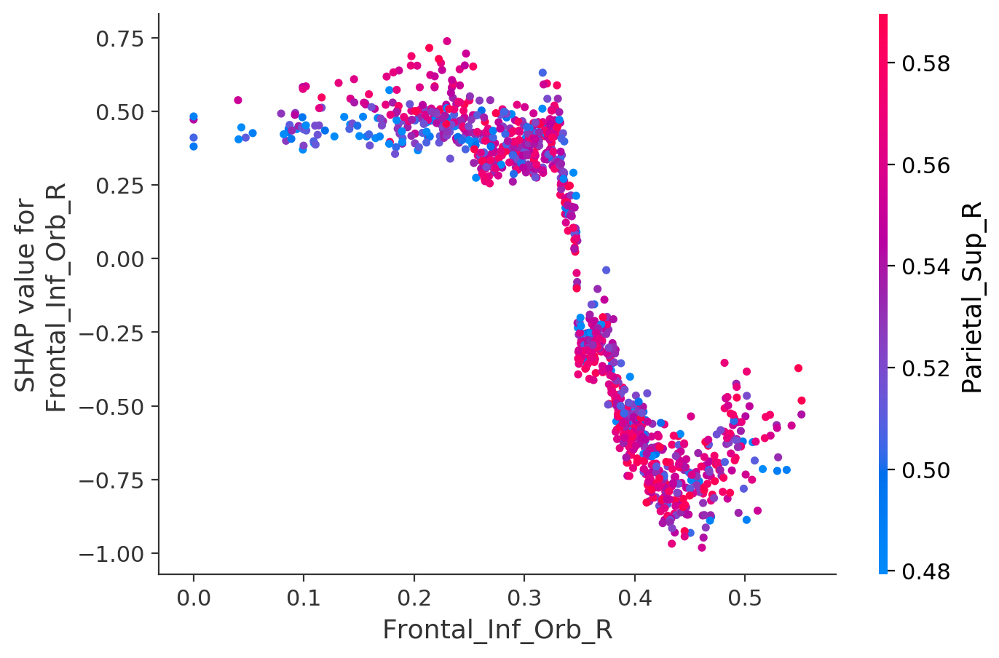

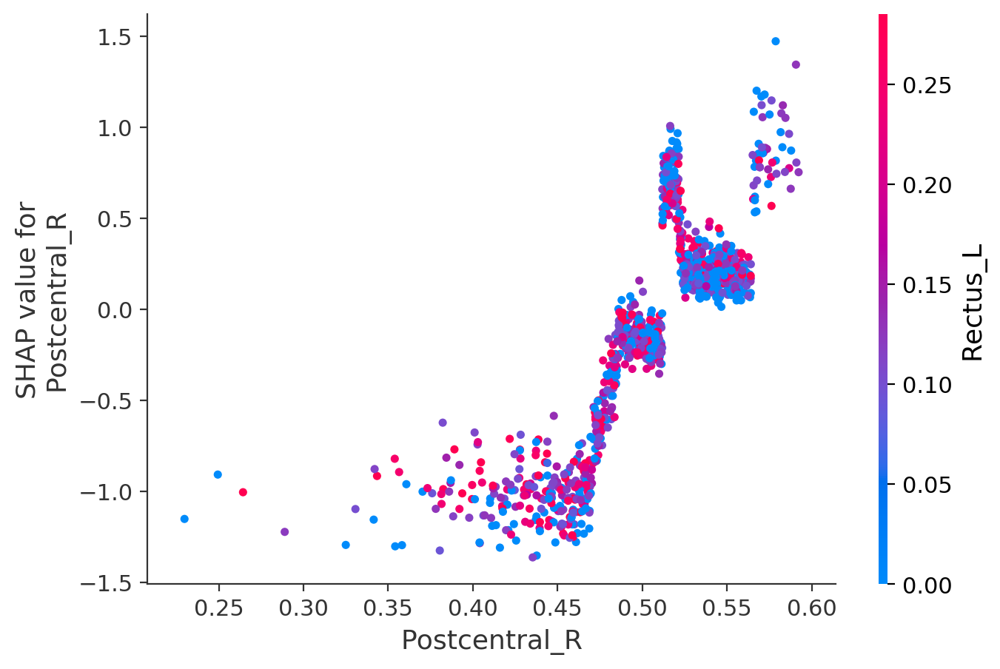

...

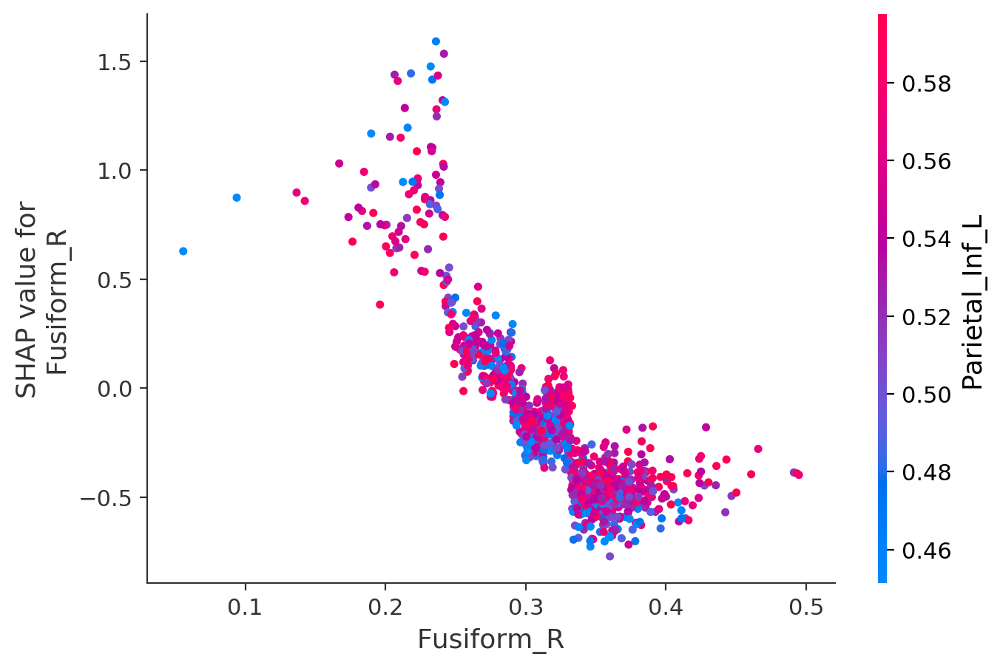

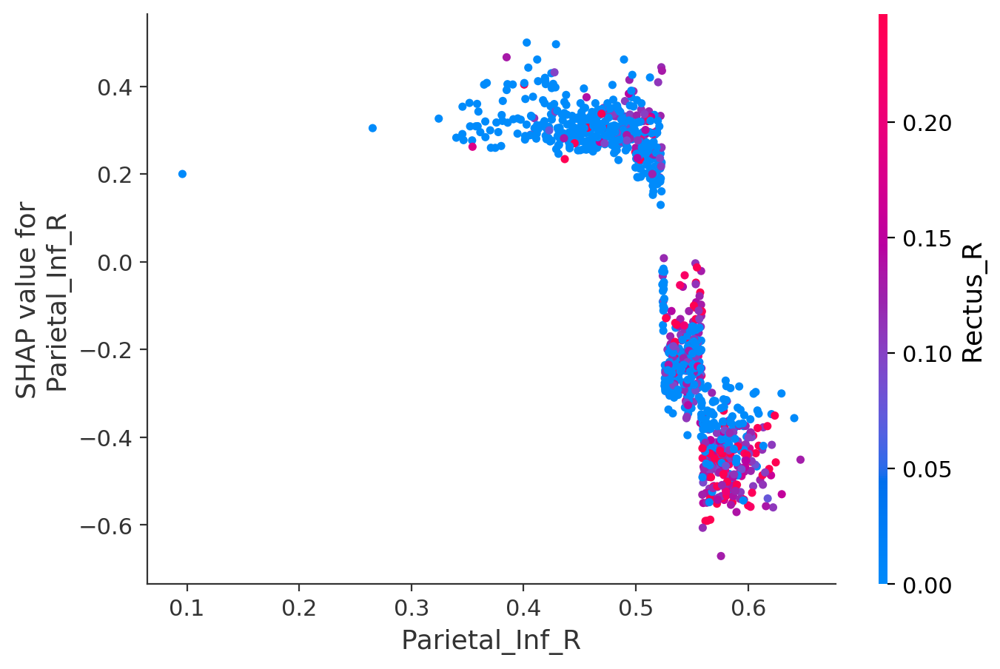

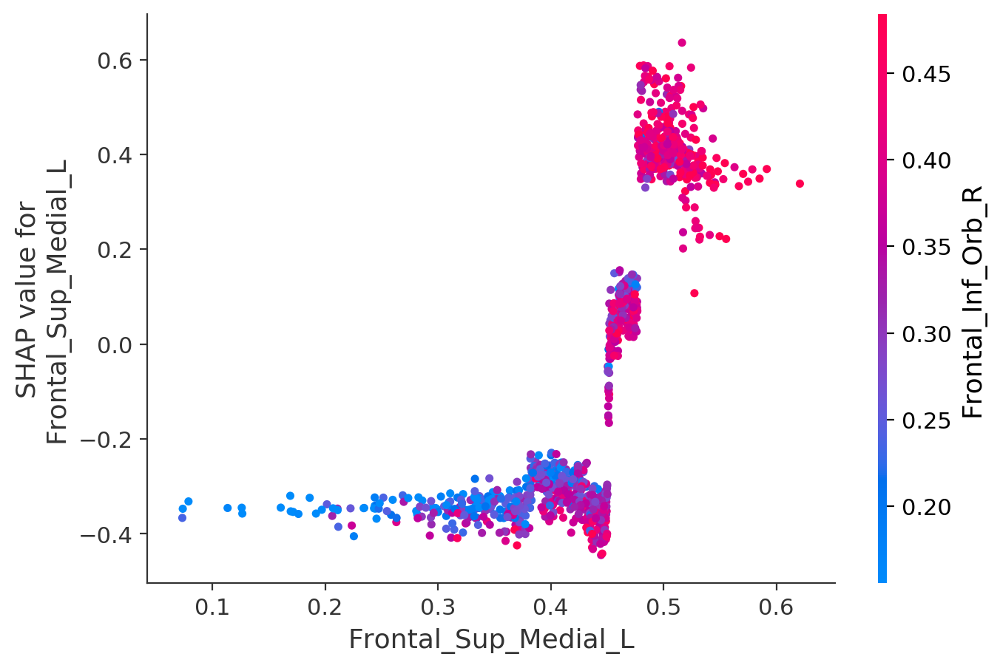

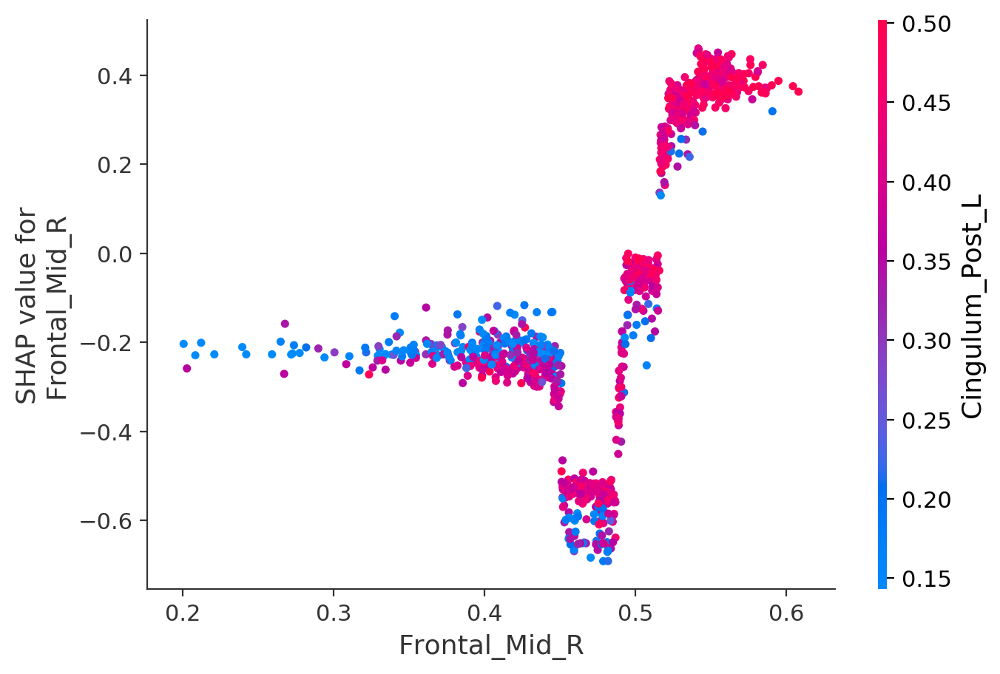

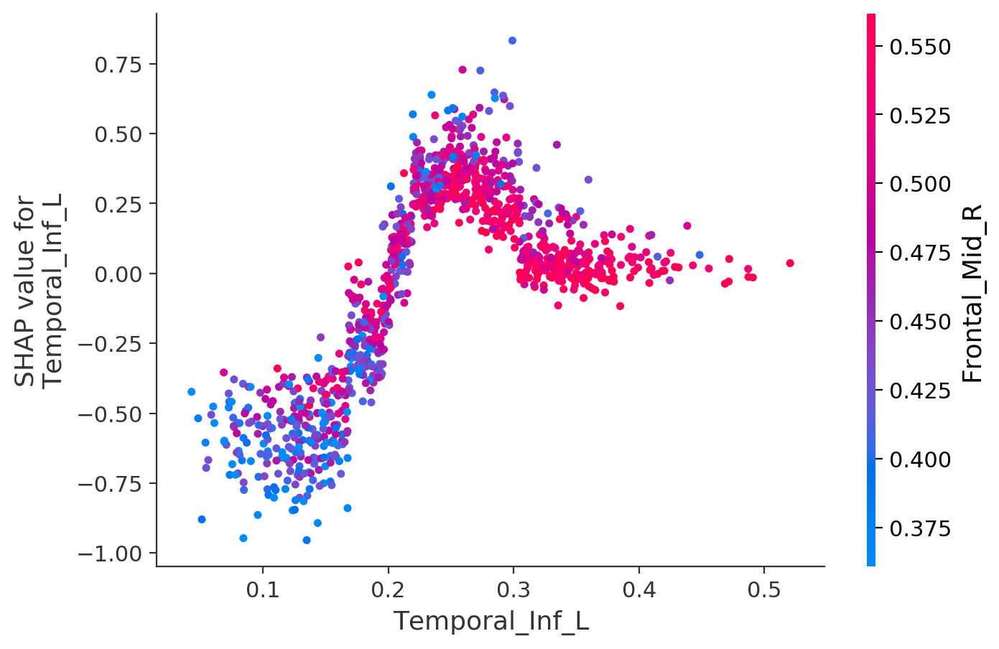

In [13]:
top_inds = np.argsort(-np.sum(np.abs(shap_values), 0))
for i in range(20):
    shap.dependence_plot(
        top_inds[i], 
        shap_values, 
        X, 
        display_features=X_display
    )

# SHAP interaction values

In [14]:
shap_interaction_values = shap.TreeExplainer(gs.best_estimator_).shap_interaction_values(X)
joblib.dump(shap_interaction_values, 'hcp_dependence_shap_interaction_values_global.pkl')

['hcp_dependence_shap_interaction_values_global.pkl']

# SHAP main effect value plots
# top 20

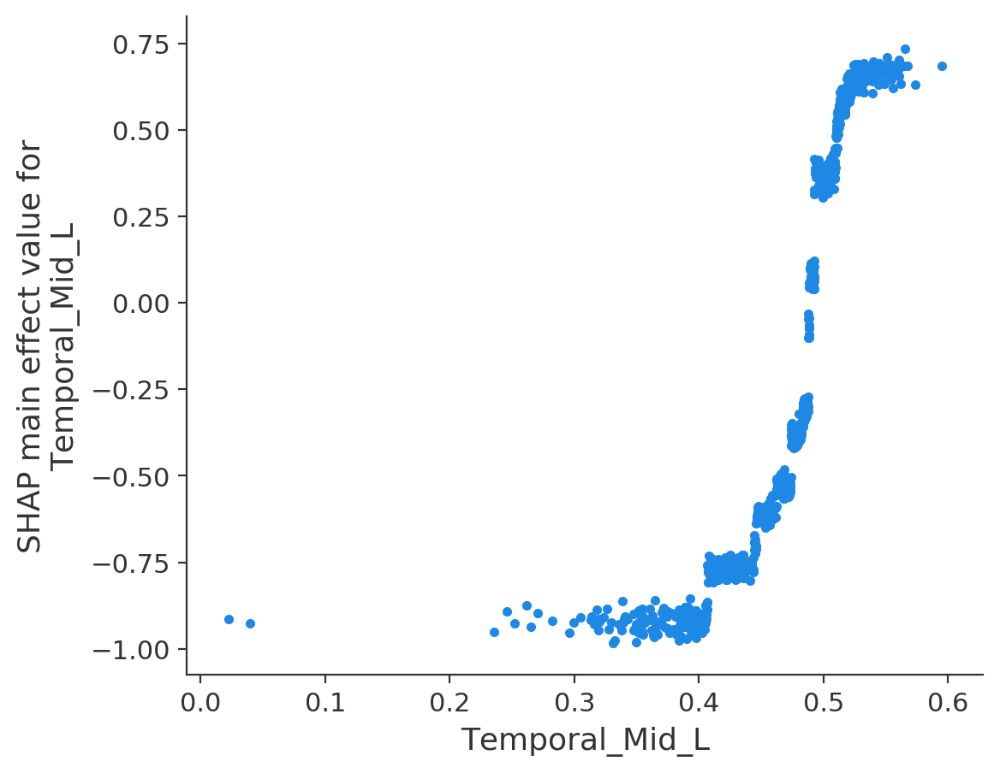

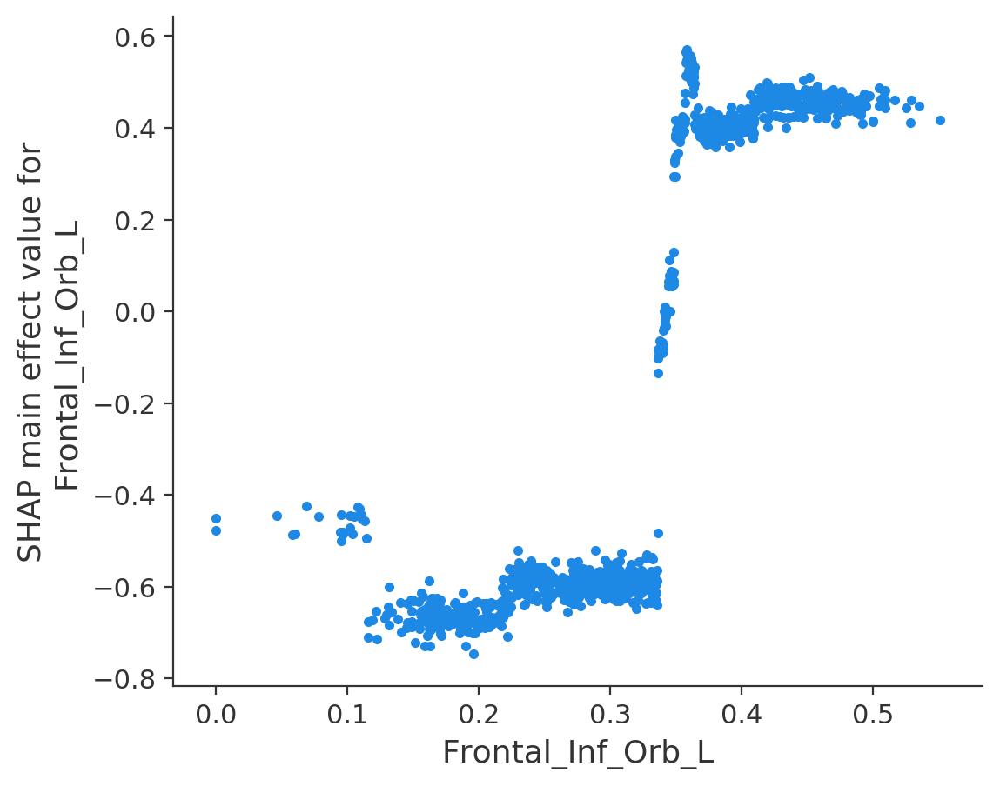

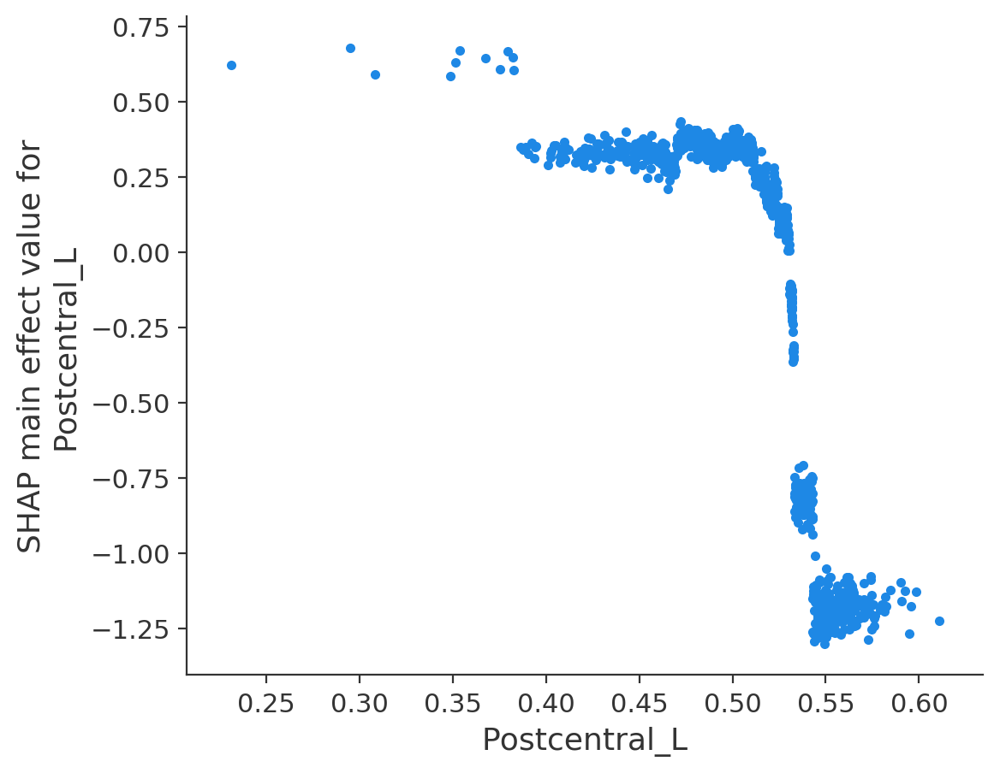

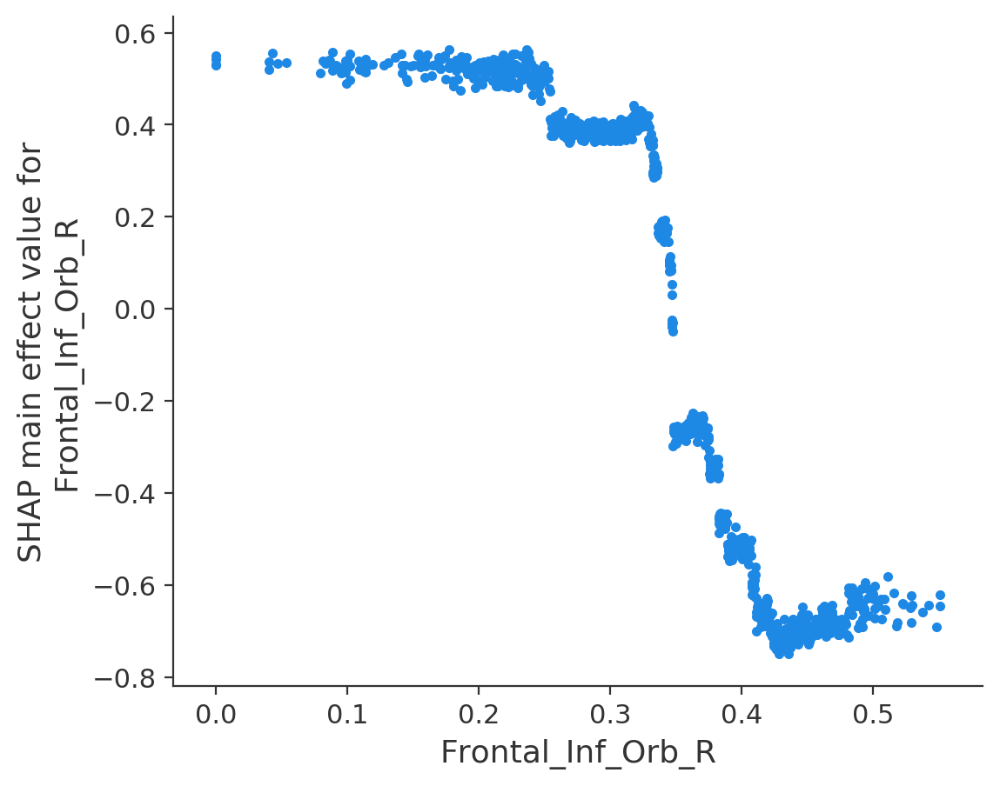

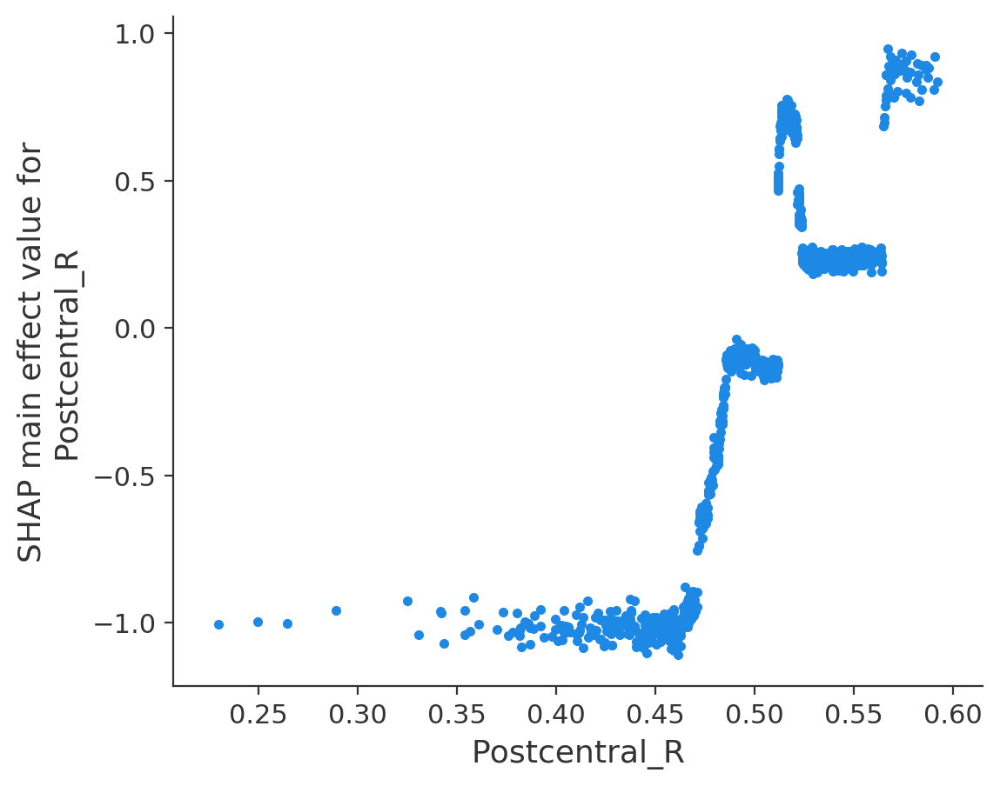

...

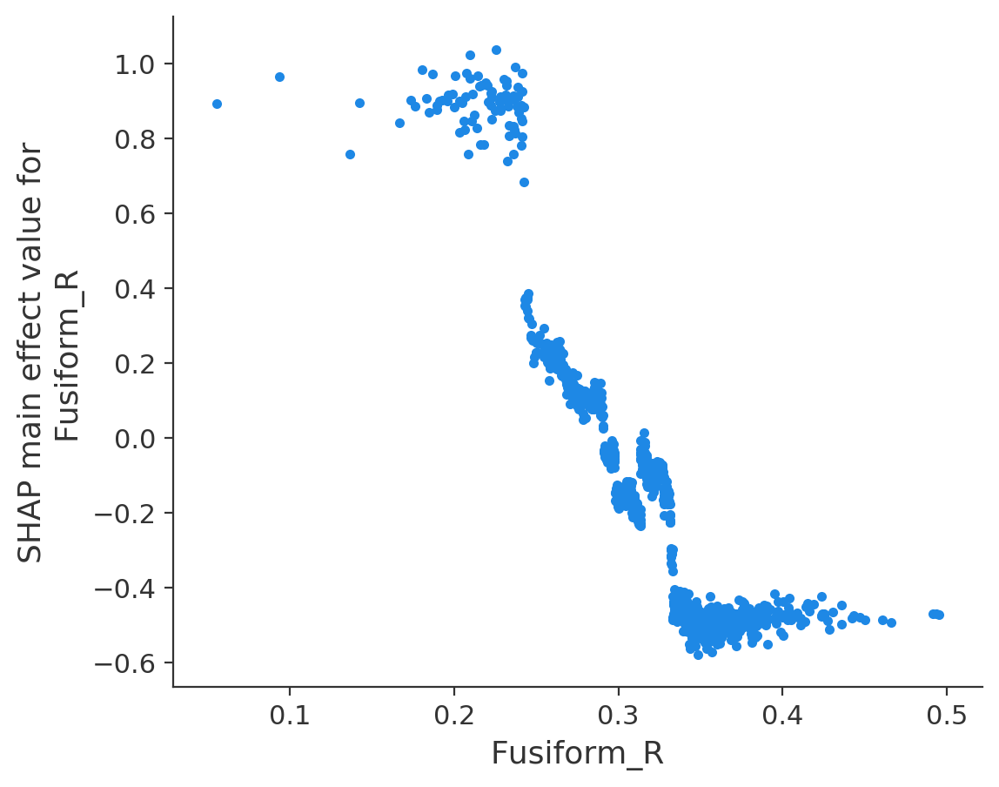

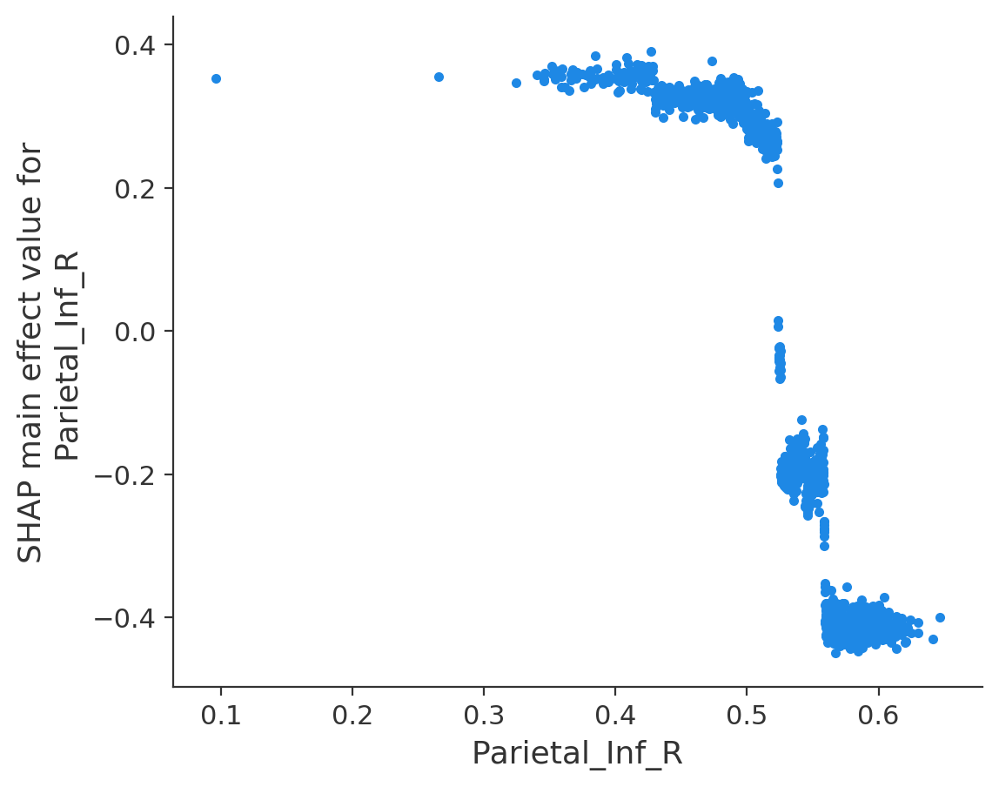

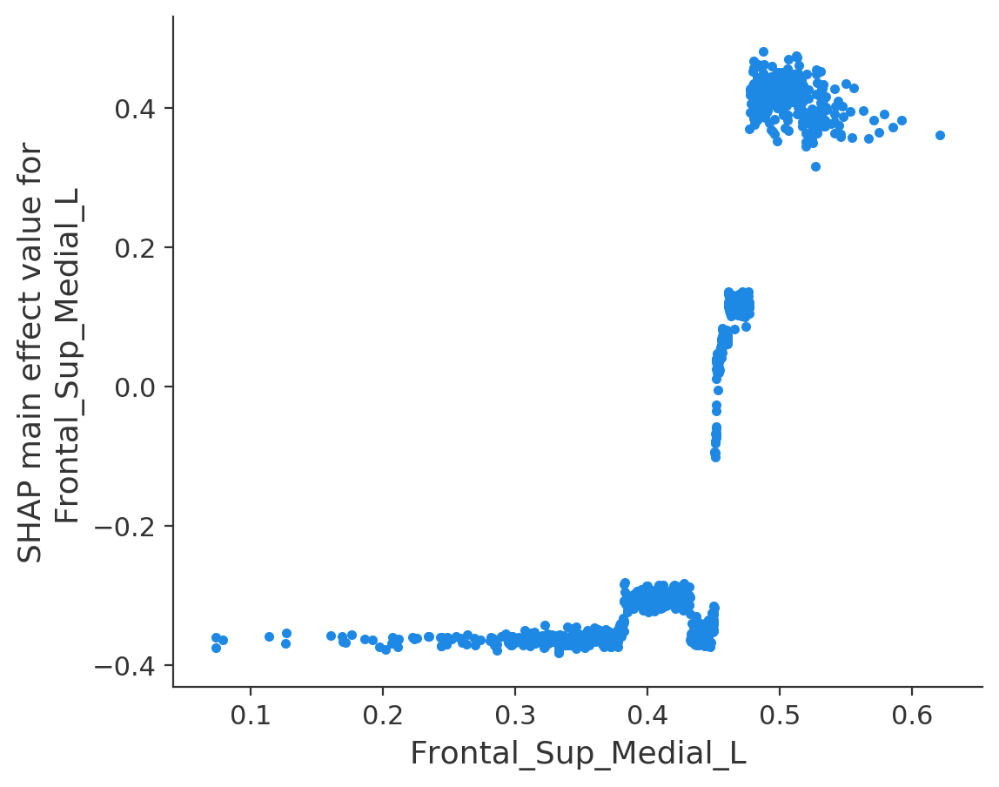

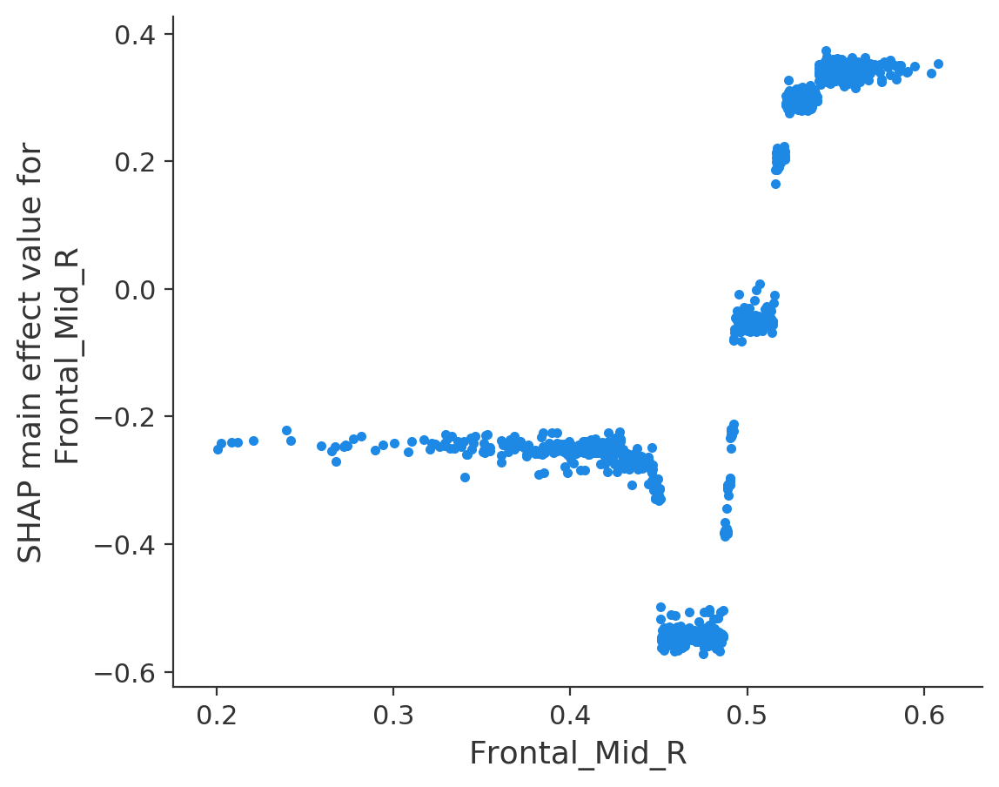

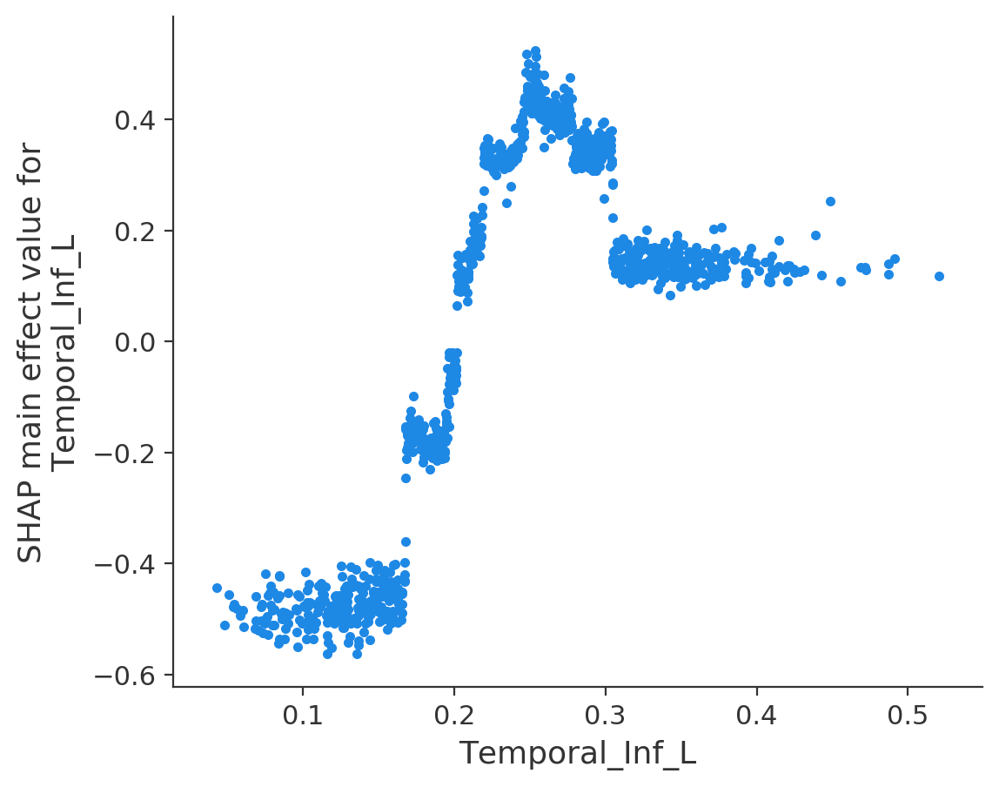

In [15]:
for i in range(20):
    shap.dependence_plot(
        (top_inds[i], top_inds[i]),
        shap_interaction_values, 
        X
    )

# SHAP interaction value plots
# top 20

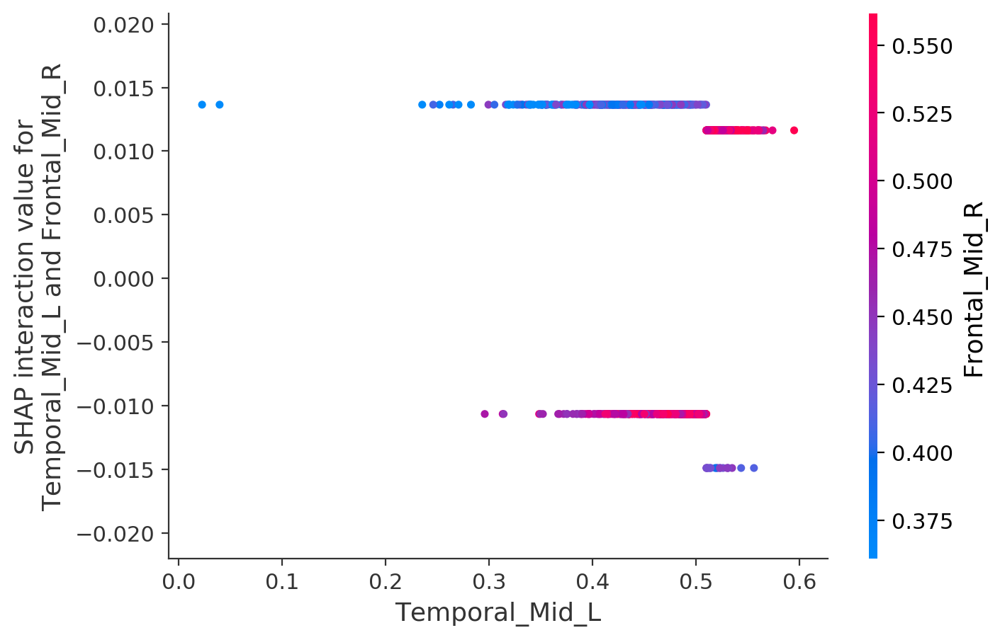

In [16]:
shap.dependence_plot(
    ('Temporal_Mid_L', 'Frontal_Mid_R'),
    shap_interaction_values, 
    X
)

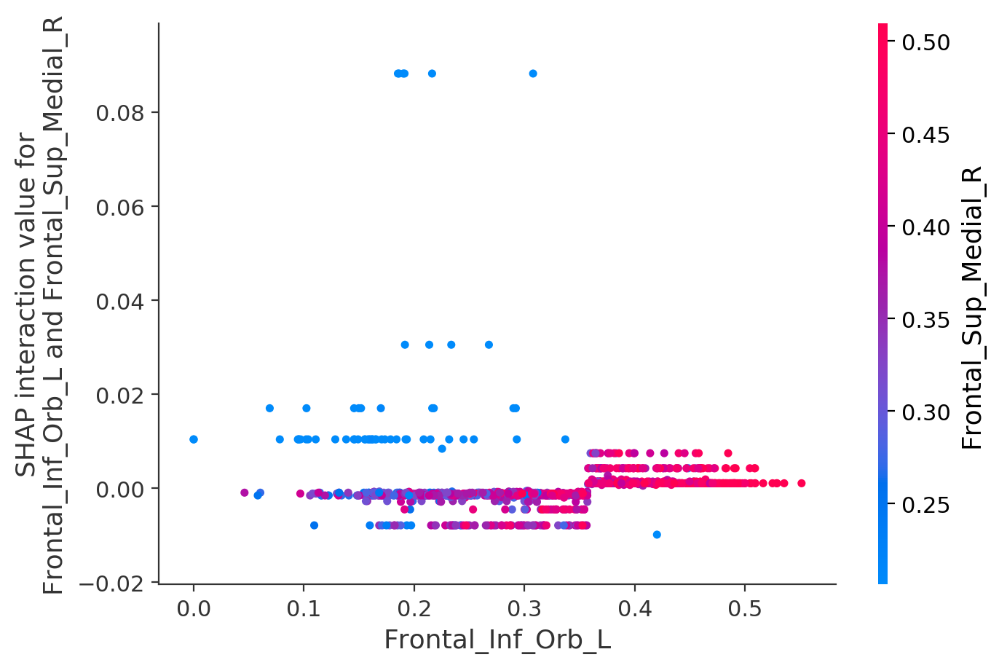

In [17]:
shap.dependence_plot(
    ('Frontal_Inf_Orb_L', 'Frontal_Sup_Medial_R'),
    shap_interaction_values, 
    X
)

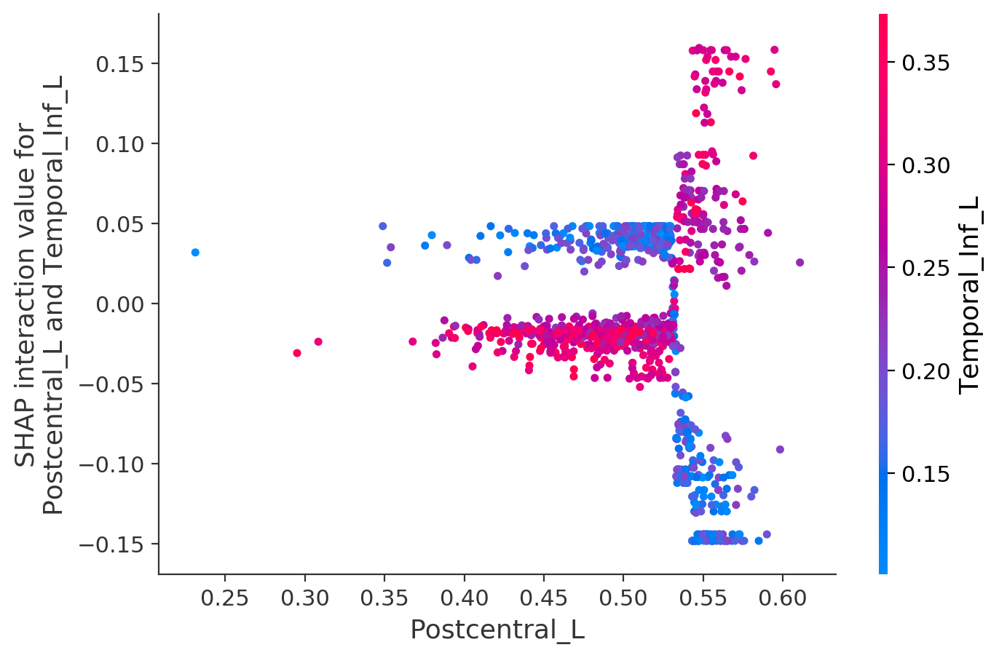

In [18]:
shap.dependence_plot(
    ('Postcentral_L', 'Temporal_Inf_L'),
    shap_interaction_values, 
    X
)

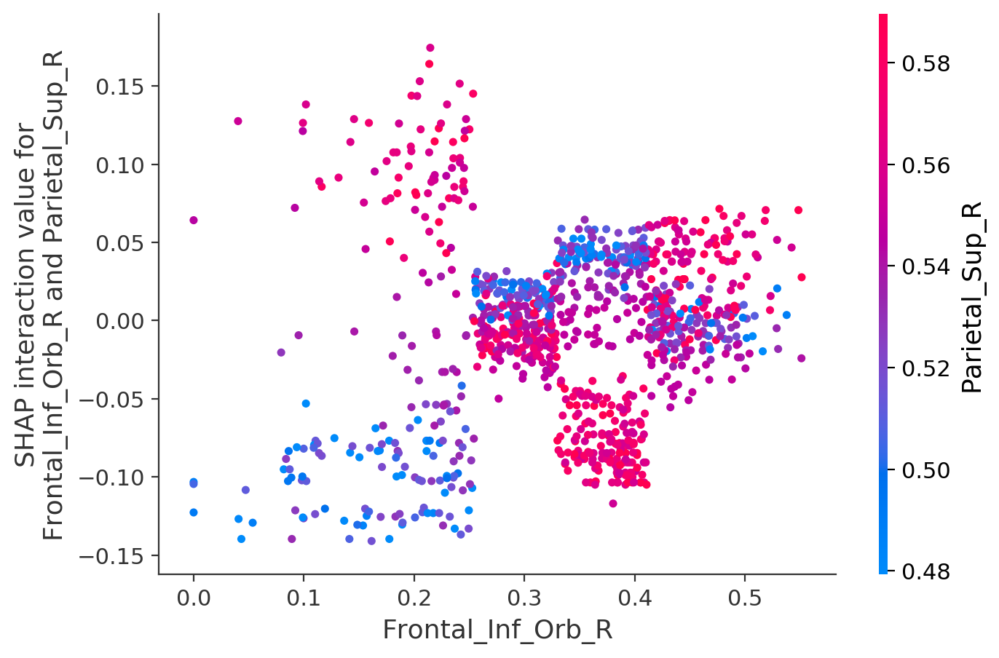

In [19]:
shap.dependence_plot(
    ('Frontal_Inf_Orb_R', 'Parietal_Sup_R'),
    shap_interaction_values, 
    X
)

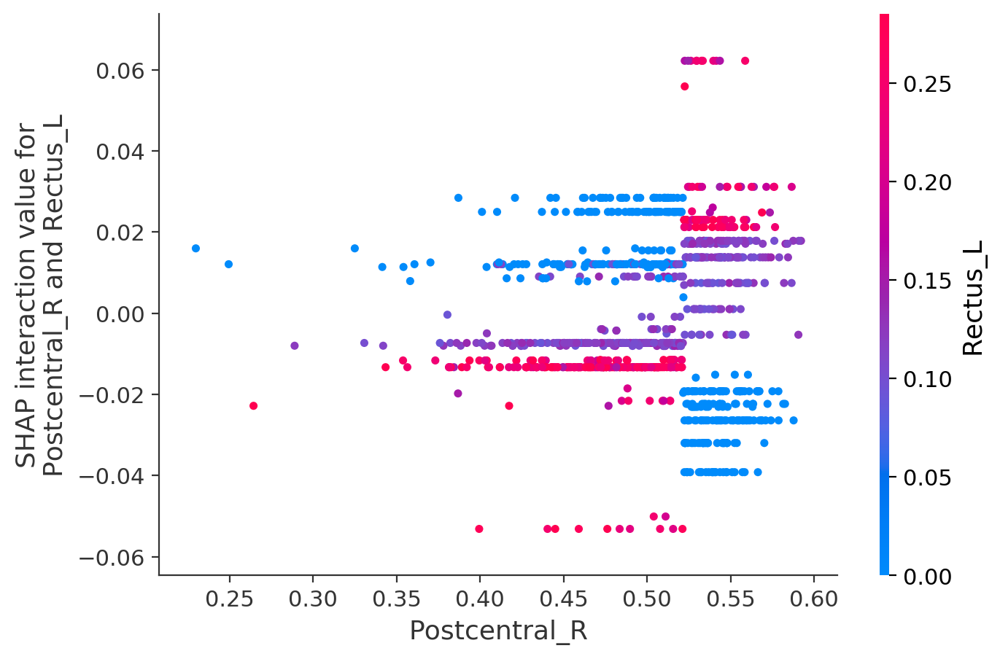

In [20]:
shap.dependence_plot(
    ('Postcentral_R', 'Rectus_L'),
    shap_interaction_values, 
    X
)

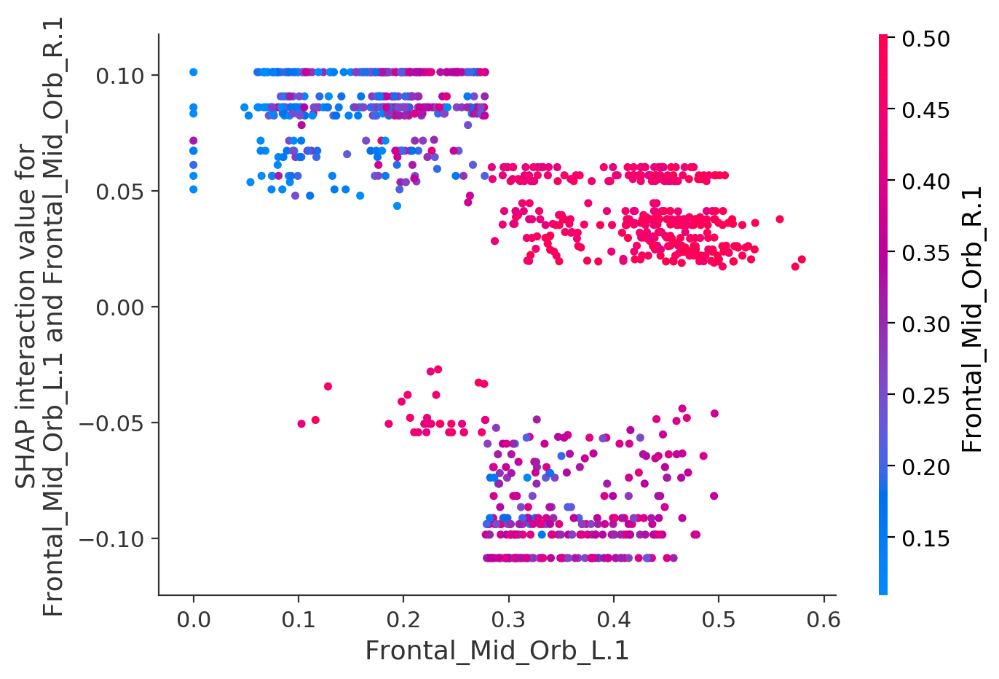

In [21]:
shap.dependence_plot(
    ('Frontal_Mid_Orb_L.1', 'Frontal_Mid_Orb_R.1'),
    shap_interaction_values, 
    X
)

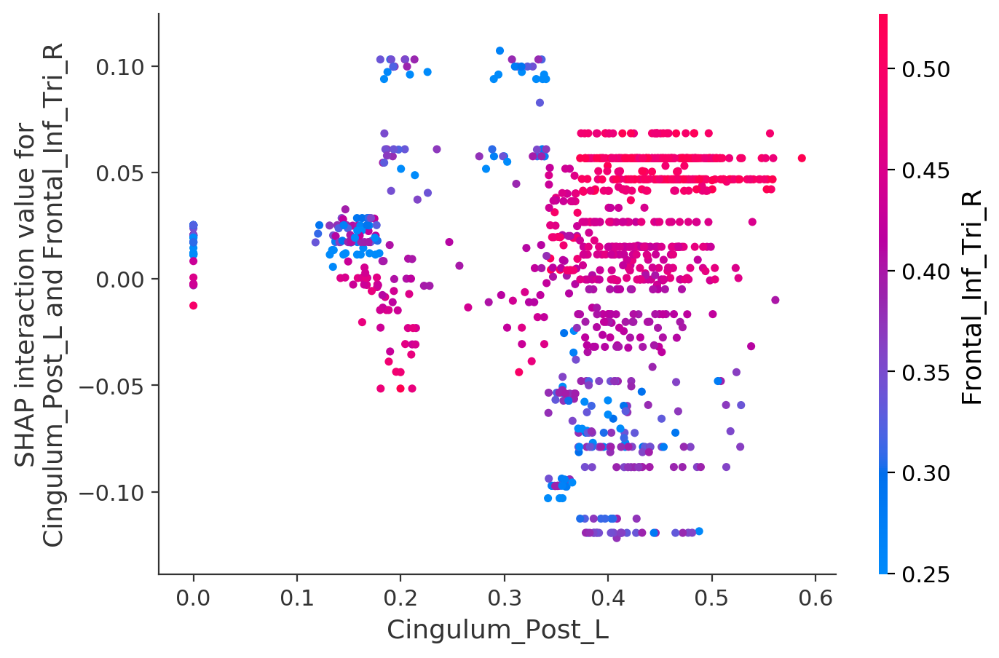

In [22]:
shap.dependence_plot(
    ('Cingulum_Post_L', 'Frontal_Inf_Tri_R'),
    shap_interaction_values, 
    X
)

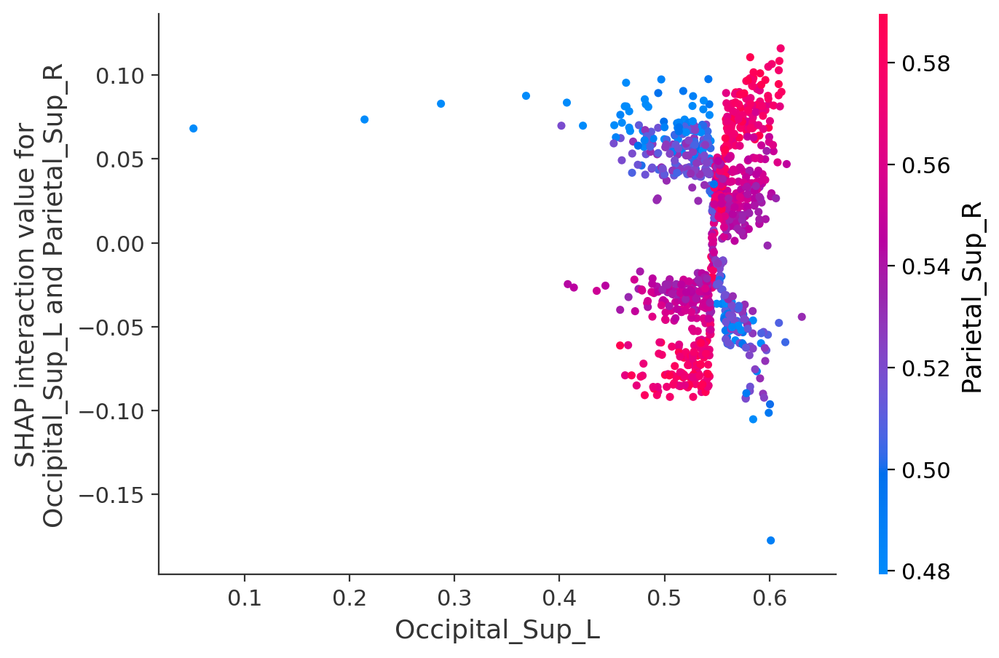

In [23]:
shap.dependence_plot(
    ('Occipital_Sup_L', 'Parietal_Sup_R'),
    shap_interaction_values, 
    X
)

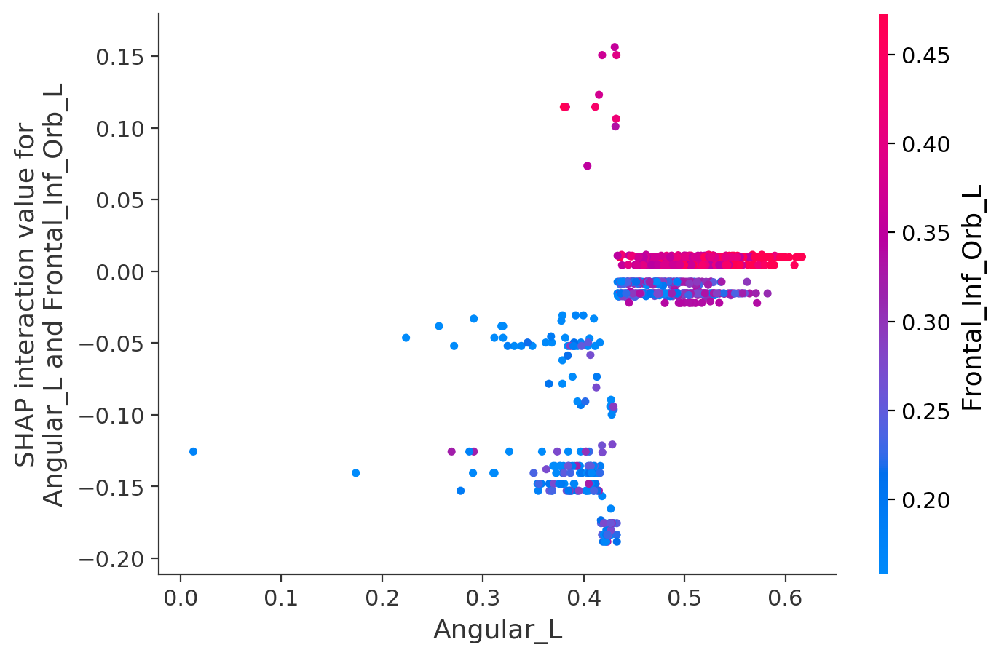

In [24]:
shap.dependence_plot(
    ('Angular_L', 'Frontal_Inf_Orb_L'),
    shap_interaction_values, 
    X
)

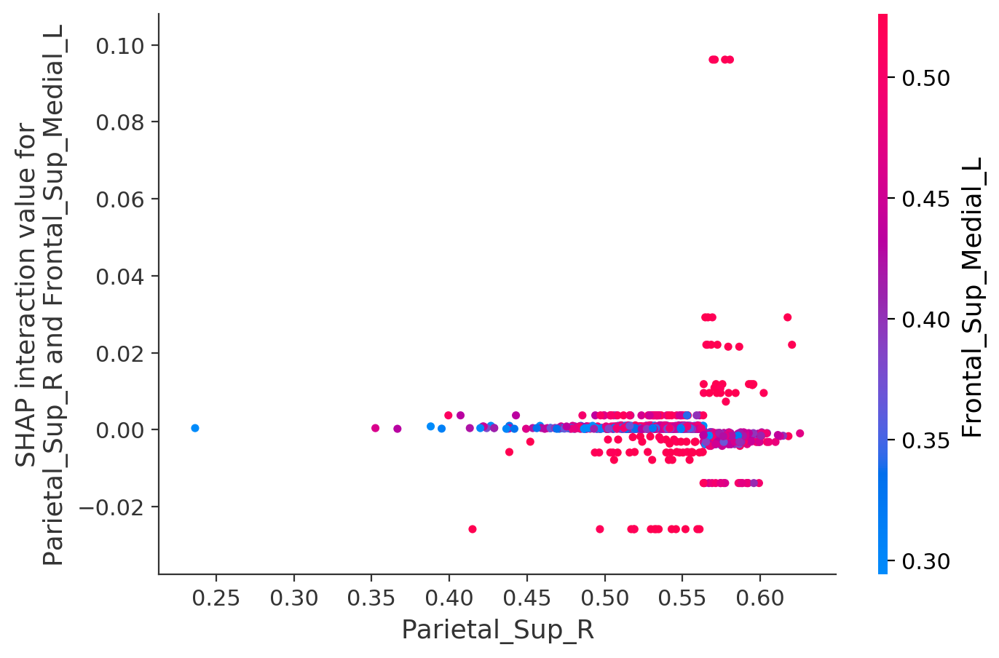

In [25]:
shap.dependence_plot(
    ('Parietal_Sup_R', 'Frontal_Sup_Medial_L'),
    shap_interaction_values, 
    X
)

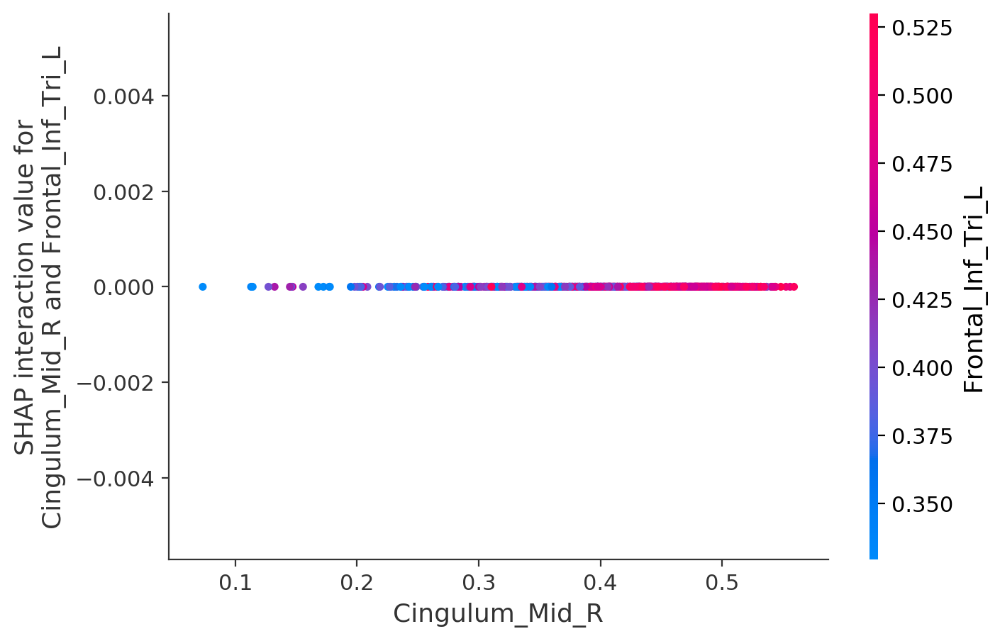

In [26]:
shap.dependence_plot(
    ('Cingulum_Mid_R', 'Frontal_Inf_Tri_L'),
    shap_interaction_values, 
    X
)

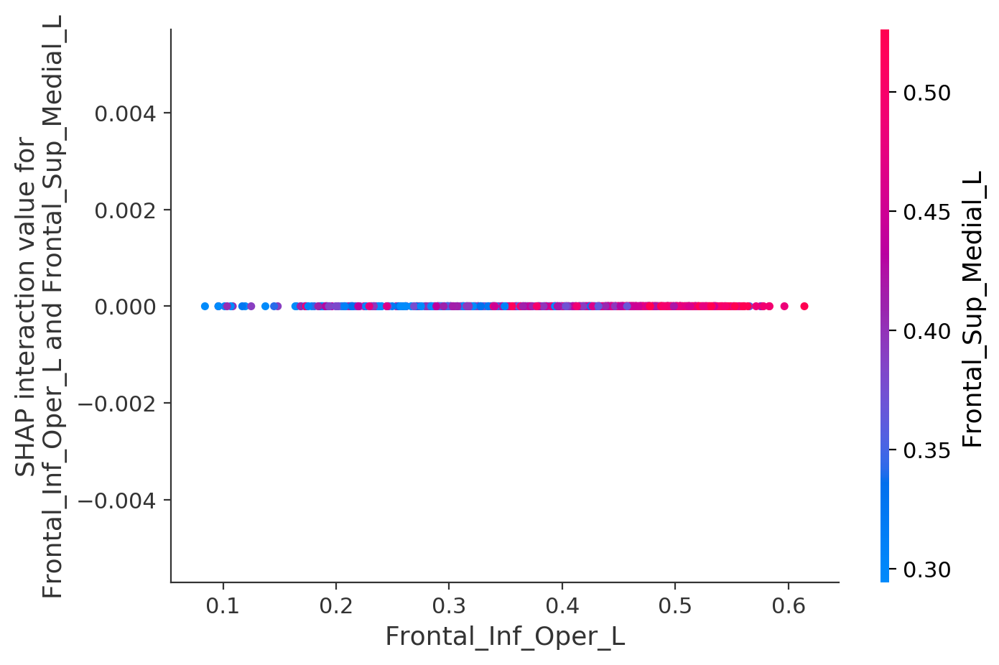

In [27]:
shap.dependence_plot(
    ('Frontal_Inf_Oper_L', 'Frontal_Sup_Medial_L'),
    shap_interaction_values, 
    X
)

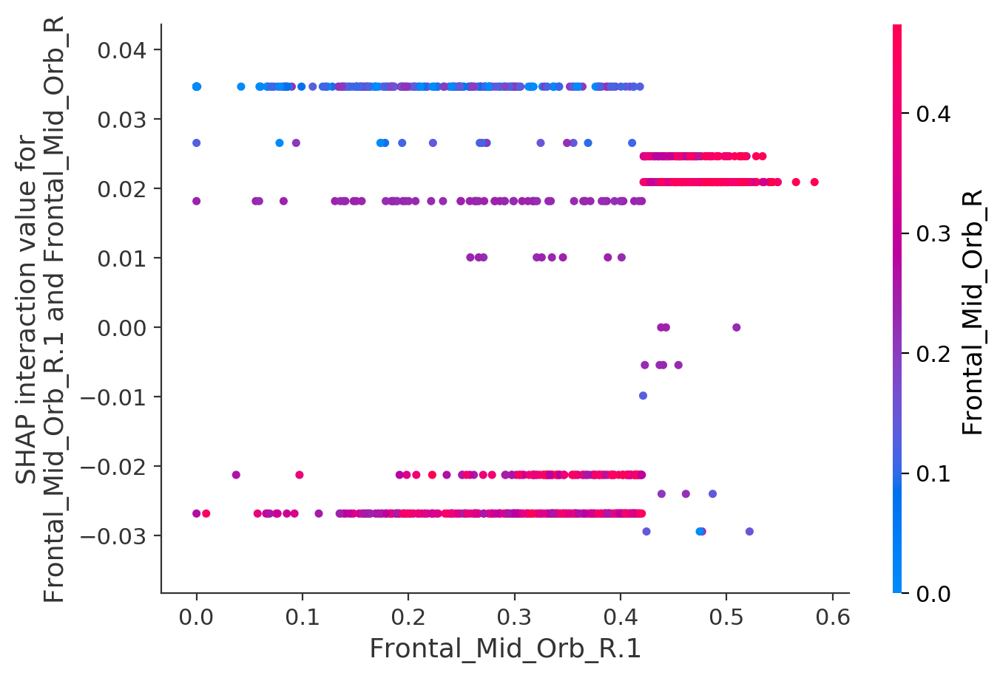

In [28]:
shap.dependence_plot(
    ('Frontal_Mid_Orb_R.1', 'Frontal_Mid_Orb_R'),
    shap_interaction_values, 
    X
)

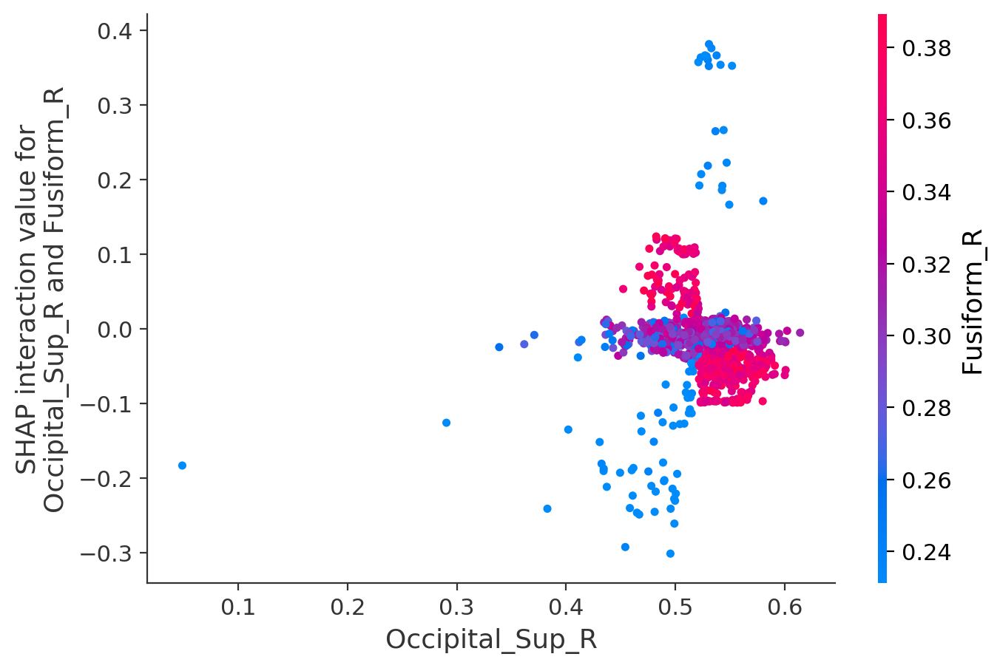

In [29]:
shap.dependence_plot(
    ('Occipital_Sup_R', 'Fusiform_R'),
    shap_interaction_values, 
    X
)

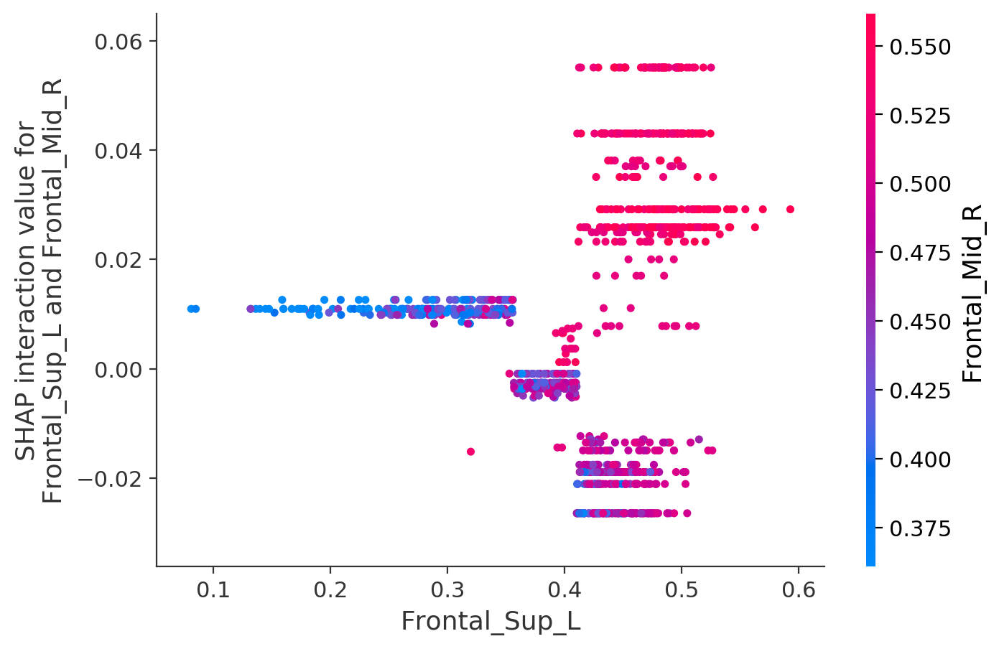

In [30]:
shap.dependence_plot(
    ('Frontal_Sup_L', 'Frontal_Mid_R'),
    shap_interaction_values, 
    X
)

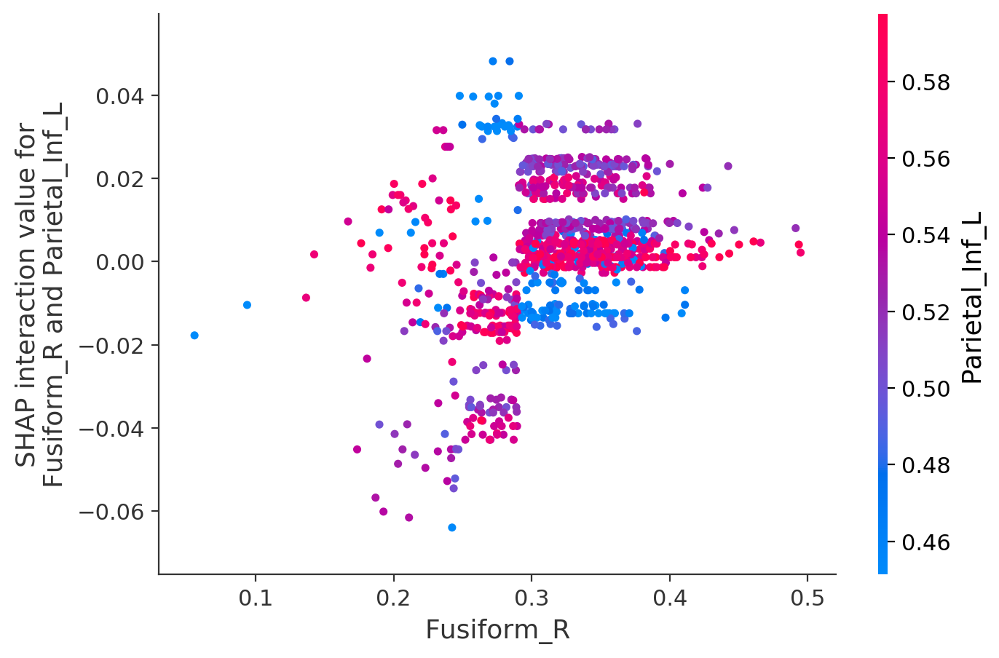

In [31]:
shap.dependence_plot(
    ('Fusiform_R', 'Parietal_Inf_L'),
    shap_interaction_values, 
    X
)

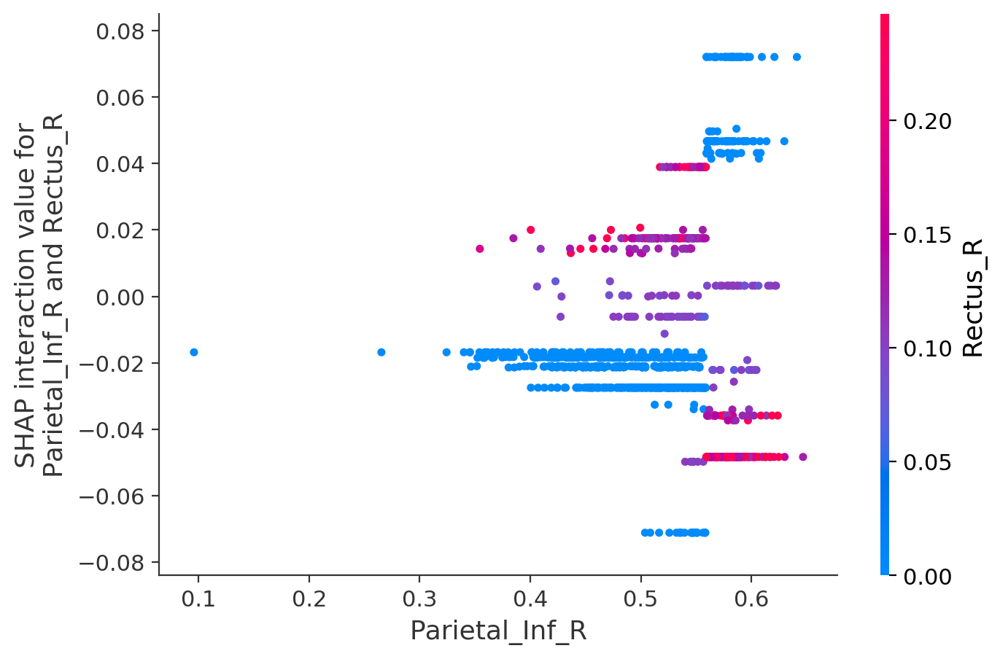

In [32]:
shap.dependence_plot(
    ('Parietal_Inf_R', 'Rectus_R'),
    shap_interaction_values, 
    X
)

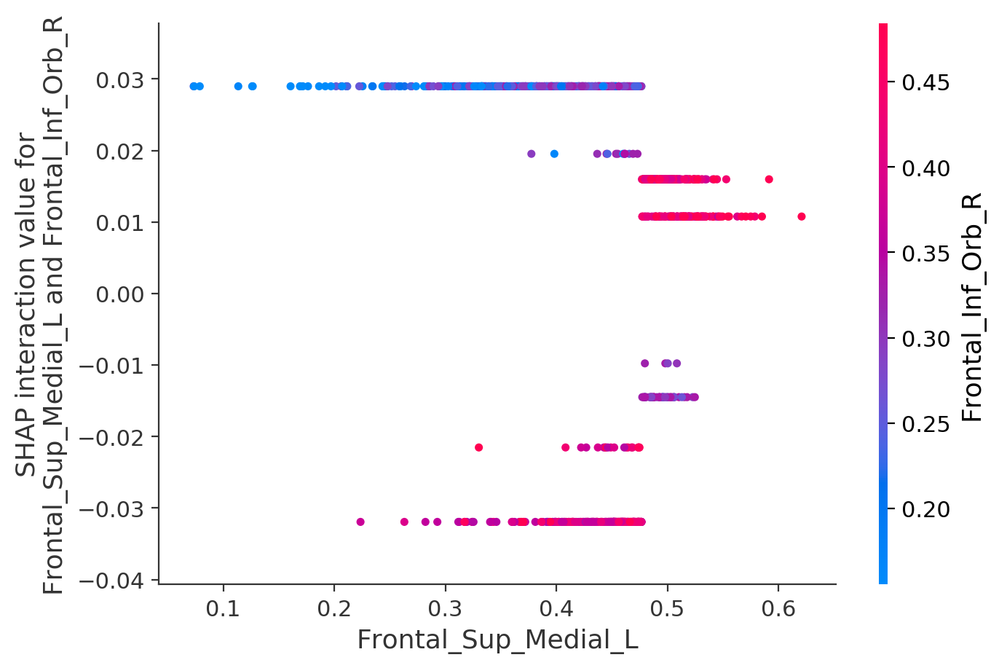

In [33]:
shap.dependence_plot(
    ('Frontal_Sup_Medial_L', 'Frontal_Inf_Orb_R'),
    shap_interaction_values, 
    X
)

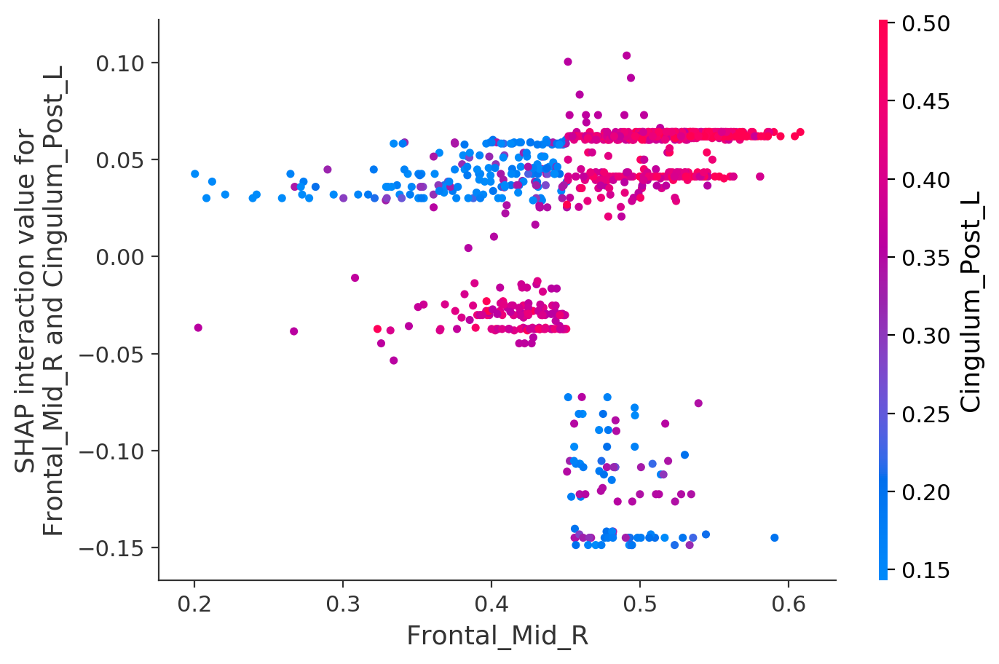

In [34]:
shap.dependence_plot(
    ('Frontal_Mid_R', 'Cingulum_Post_L'),
    shap_interaction_values, 
    X
)

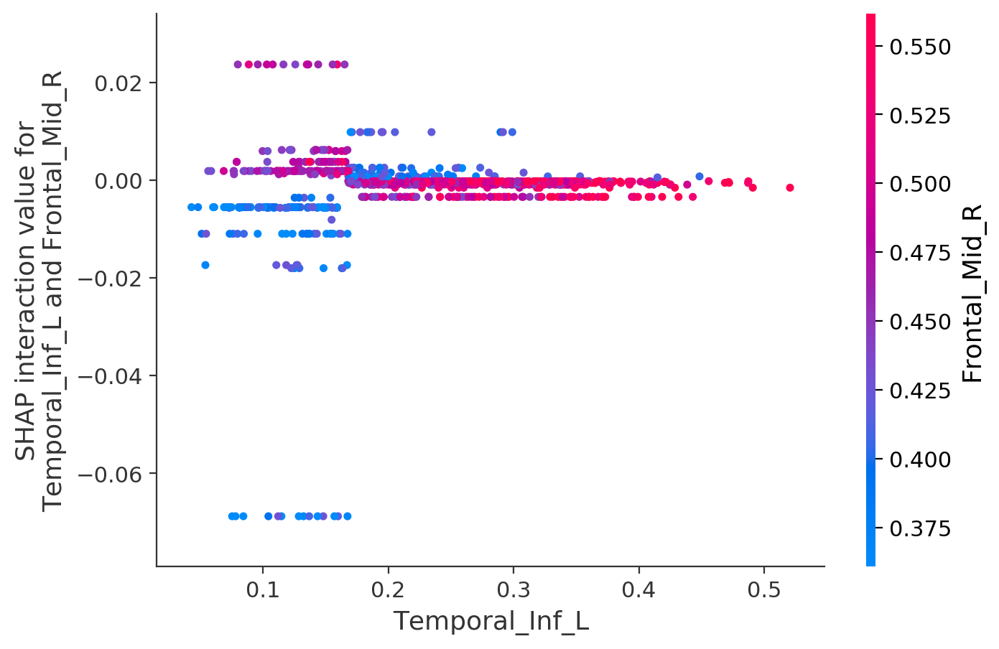

In [35]:
shap.dependence_plot(
    ('Temporal_Inf_L', 'Frontal_Mid_R'),
    shap_interaction_values, 
    X
)